**Data Dictionary**

Each row in this file corresponds to one unique delivery. Each column corresponds to a
feature as explained below.
1. **market_id** : integer id for the market where the restaurant lies
2. **created_at** : the timestamp at which the order was placed
3. **actual_delivery_time** : the timestamp when the order was delivered
4. **store_primary_category** : category for the restaurant
5. **order_protocol** : integer code value for order protocol(how the order was placed
ie: through porter, call to restaurant, pre booked, third part etc)
6. **total_items subtotal** : final price of the order
7. **num_distinct_items** : the number of distinct items in the order
8. **min_item_price** : price of the cheapest item in the order
9. **max_item_price** : price of the costliest item in order
10. **total_onshift_partners** : number of delivery partners on duty at the time order
was placed
11. **total_busy_partners** : number of delivery partners attending to other tasks
12. **total_outstanding_orders** : total number of orders to be fulfilled at the moment

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense,LeakyReLU,BatchNormalization,Dropout
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam,RMSprop
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.losses import Huber
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint,TensorBoard
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import load_model

import datetime
import os

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('dataset.csv')

In [ ]:
df.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,1.0,2015-02-06 22:24:17,2015-02-06 23:27:16,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,2.0,2015-02-10 21:49:25,2015-02-10 22:56:29,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,3.0,2015-01-22 20:39:28,2015-01-22 21:09:09,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,3.0,2015-02-03 21:21:45,2015-02-03 22:13:00,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,3.0,2015-02-15 02:40:36,2015-02-15 03:20:26,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,6.0,9.0


In [ ]:
df.shape

(197428, 14)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197428 entries, 0 to 197427
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   market_id                 196441 non-null  float64
 1   created_at                197428 non-null  object 
 2   actual_delivery_time      197421 non-null  object 
 3   store_id                  197428 non-null  object 
 4   store_primary_category    192668 non-null  object 
 5   order_protocol            196433 non-null  float64
 6   total_items               197428 non-null  int64  
 7   subtotal                  197428 non-null  int64  
 8   num_distinct_items        197428 non-null  int64  
 9   min_item_price            197428 non-null  int64  
 10  max_item_price            197428 non-null  int64  
 11  total_onshift_partners    181166 non-null  float64
 12  total_busy_partners       181166 non-null  float64
 13  total_outstanding_orders  181166 non-null  f

In [ ]:
df.isna().sum()

,0
market_id,987
created_at,0
actual_delivery_time,7
store_id,0
store_primary_category,4760
order_protocol,995
total_items,0
subtotal,0
num_distinct_items,0
min_item_price,0


In [ ]:
df.dtypes

,0
market_id,float64
created_at,object
actual_delivery_time,object
store_id,object
store_primary_category,object
order_protocol,float64
total_items,int64
subtotal,int64
num_distinct_items,int64
min_item_price,int64


In [ ]:
## Converting 'created_at' and 'actual_delivery_time' to datetime columns

df['created_at'] = pd.to_datetime(df['created_at'])
df['actual_delivery_time'] = pd.to_datetime(df['actual_delivery_time'])

In [ ]:
df.dtypes

,0
market_id,float64
created_at,datetime64[ns]
actual_delivery_time,datetime64[ns]
store_id,object
store_primary_category,object
order_protocol,float64
total_items,int64
subtotal,int64
num_distinct_items,int64
min_item_price,int64


## Feature Engineering

In [ ]:
## Estimating timetaken in minutes

df['time_taken'] = (df['actual_delivery_time'] - df['created_at']).dt.total_seconds() / 60

In [ ]:
## Creating new column 'time taken'

df['time_taken'] = df['time_taken'].round(0)

In [ ]:
df.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken
0,1.0,2015-02-06 22:24:17,2015-02-06 23:27:16,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,14.0,21.0,63.0
1,2.0,2015-02-10 21:49:25,2015-02-10 22:56:29,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,2.0,2.0,67.0
2,3.0,2015-01-22 20:39:28,2015-01-22 21:09:09,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,0.0,0.0,30.0
3,3.0,2015-02-03 21:21:45,2015-02-03 22:13:00,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,1.0,2.0,51.0
4,3.0,2015-02-15 02:40:36,2015-02-15 03:20:26,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,6.0,9.0,40.0


In [ ]:
## Creating new columns based on 'created_at' column

df['day_of_week'] = df['created_at'].dt.day_of_week
df['year_o'] = df['created_at'].dt.year.astype('int64')
df['month_o'] = df['created_at'].dt.month.astype('int64')
df['day_o'] =   df['created_at'].dt.day.astype('int64')
df['hour_o'] = df['created_at'].dt.hour.astype('int64')
df['minute_o'] = df['created_at'].dt.minute.astype('int64')
df['second_o'] = df['created_at'].dt.second.astype('int64')

In [ ]:
df = df.dropna(subset = ['actual_delivery_time'])

In [ ]:
## Creating new columns based on 'actual_delivery_time' column

df['year_d'] = df['actual_delivery_time'].dt.year.astype('int64')
df['month_d'] = df['actual_delivery_time'].dt.month.astype('int64')
df['day_d'] =   df['actual_delivery_time'].dt.day.astype('int64')
df['hour_d'] =   df['actual_delivery_time'].dt.hour.astype('int64')
df['minute_d'] = df['actual_delivery_time'].dt.minute.astype('int64')
df['second_d'] = df['actual_delivery_time'].dt.second.astype('int64')
df['day_of_week_d'] = df['actual_delivery_time'].dt.day_of_week

In [ ]:
df.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,2015-02-06 22:24:17,2015-02-06 23:27:16,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,2015-02-10 21:49:25,2015-02-10 22:56:29,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,2015-01-22 20:39:28,2015-01-22 21:09:09,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,2015-02-03 21:21:45,2015-02-03 22:13:00,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,2015-02-15 02:40:36,2015-02-15 03:20:26,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,...,2,40,36,2015,2,15,3,20,26,6


In [ ]:
df.dtypes

,0
market_id,float64
created_at,datetime64[ns]
actual_delivery_time,datetime64[ns]
store_id,object
store_primary_category,object
order_protocol,float64
total_items,int64
subtotal,int64
num_distinct_items,int64
min_item_price,int64


In [ ]:
## Droppping Unnecessary Columns

df.drop(['created_at', 'actual_delivery_time'], axis=1, inplace=True)

In [ ]:
df.head()

,market_id,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,...,2,40,36,2015,2,15,3,20,26,6


In [ ]:
df.isna().sum()

,0
market_id,987
store_id,0
store_primary_category,4760
order_protocol,995
total_items,0
subtotal,0
num_distinct_items,0
min_item_price,0
max_item_price,0
total_onshift_partners,16262


In [ ]:
## Dropping null vales records in target variable

df = df[~df['time_taken'].isna()]

In [ ]:
df

,market_id,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,...,2,40,36,2015,2,15,3,20,26,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197423,1.0,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,3,1389,3,345,649,17.0,...,0,19,41,2015,2,17,1,24,48,1
197424,1.0,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,6,3010,4,405,825,12.0,...,0,1,59,2015,2,13,0,58,22,4
197425,1.0,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,5,1836,3,300,399,39.0,...,4,46,8,2015,1,24,5,36,16,5
197426,1.0,c81e155d85dae5430a8cee6f2242e82c,sandwich,1.0,1,1175,1,535,535,7.0,...,18,18,15,2015,2,1,19,23,22,6


In [ ]:
df.isna().sum()

,0
market_id,987
store_id,0
store_primary_category,4760
order_protocol,995
total_items,0
subtotal,0
num_distinct_items,0
min_item_price,0
max_item_price,0
total_onshift_partners,16262


In [ ]:
## Dropping 'store_id' column

df.drop('store_id', axis=1, inplace=True)

#### Treating Null Values

In [ ]:
df['store_primary_category'] = df['store_primary_category'].fillna(df['store_primary_category'].mode()[0])

In [ ]:
df['total_onshift_partners'] =  df['total_onshift_partners'].fillna(df['total_onshift_partners'].median())
df['total_busy_partners'] =  df['total_busy_partners'].fillna(df['total_busy_partners'].median())
df['total_outstanding_orders'] =  df['total_outstanding_orders'].fillna(df['total_outstanding_orders'].median())

In [ ]:
df['market_id'] = df['market_id'].fillna(df['market_id'].mode()[0])
df['order_protocol'] = df['order_protocol'].fillna(df['order_protocol'].mode()[0])

In [ ]:
df.shape

(197421, 26)

In [ ]:
df.head()

,market_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,american,1.0,4,3441,4,557,1239,33.0,14.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,mexican,2.0,1,1900,1,1400,1400,1.0,2.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,american,1.0,1,1900,1,1900,1900,1.0,0.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,american,1.0,6,6900,5,600,1800,1.0,1.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,american,1.0,3,3900,3,1100,1600,6.0,6.0,...,2,40,36,2015,2,15,3,20,26,6


In [ ]:
df['store_primary_category'].value_counts()

,count
store_primary_category,
american,24159
pizza,17320
mexican,17098
burger,10958
sandwich,10059
...,...
lebanese,9
belgian,2
indonesian,2


## Exploratory Data Analysis (EDA)

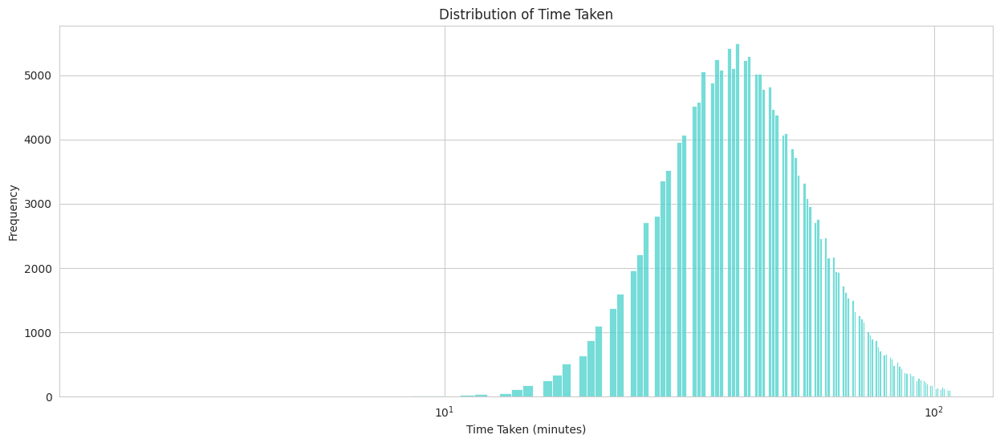

In [ ]:
plt.figure(figsize=(15, 6))
sns.set_style('whitegrid')
sns.histplot(df['time_taken'],color = 'mediumturquoise')
plt.xscale('log')
plt.title('Distribution of Time Taken')
plt.xlabel('Time Taken (minutes)')
plt.ylabel('Frequency')
plt.show()

#### This graph simply depicts distribution of time taken for the most number of orders.

#### Most Orders takes aprroximately between 40 to 60 minutes to deliver.

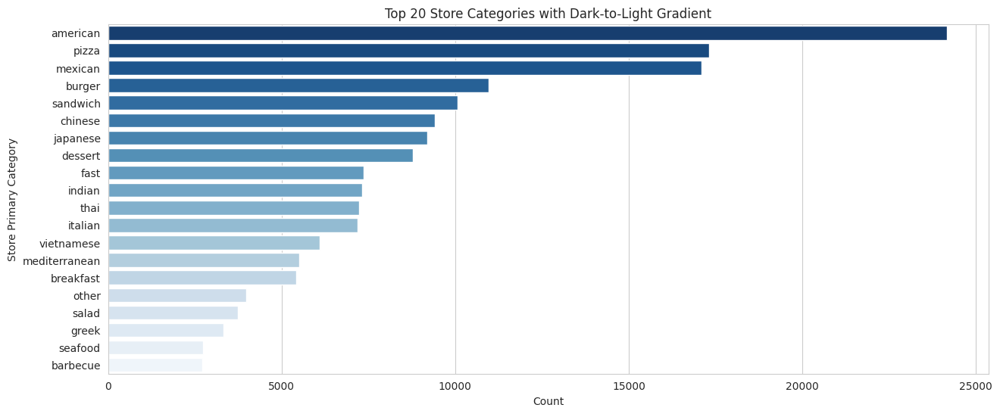

In [ ]:
plt.figure(figsize=(15, 6))
sns.set_style('whitegrid')

top_categories = df['store_primary_category'].value_counts().index[:20]
counts = df['store_primary_category'].value_counts().iloc[:20]

colors = sns.color_palette("Blues_r", len(top_categories))

ax = sns.barplot(y=top_categories, x=counts, palette=colors)

plt.xlabel("Count")
plt.ylabel("Store Primary Category")
plt.title("Top 20 Store Categories with Dark-to-Light Gradient")

plt.show()

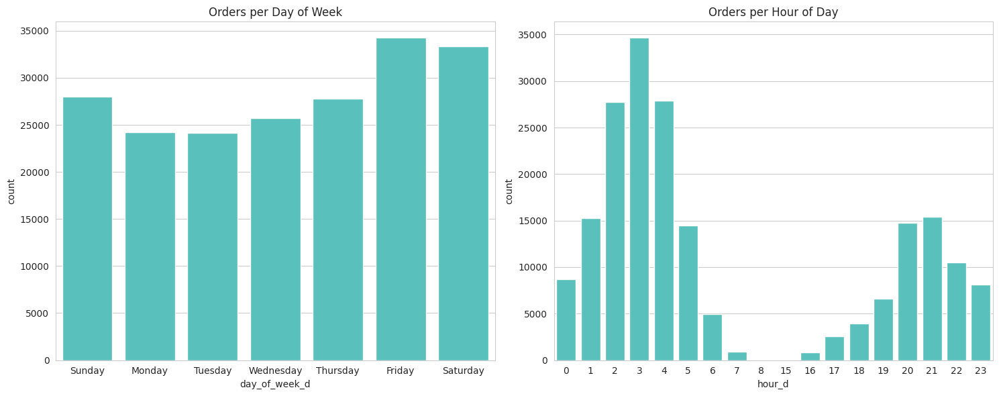

In [ ]:
plt.figure(figsize = (15,6))
sns.set_style("whitegrid")
palette = sns.color_palette("Paired")
days = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

plt.subplot(1,2,1)
sns.countplot(data = df, x = 'day_of_week_d', color = 'mediumturquoise')
ax = plt.gca()
ax.set_xticks(range(7))
ax.set_xticklabels(days)
plt.title('Orders per Day of Week')


plt.subplot(1,2,2)
sns.countplot(data = df, x = 'hour_d', color = 'mediumturquoise')
plt.title('Orders per Hour of Day')

plt.tight_layout()
plt.show()

#### Weekends have recieved highest number of orders.
#### Most number of orders wwere placed around 2,3 and 4 o'clock. at night

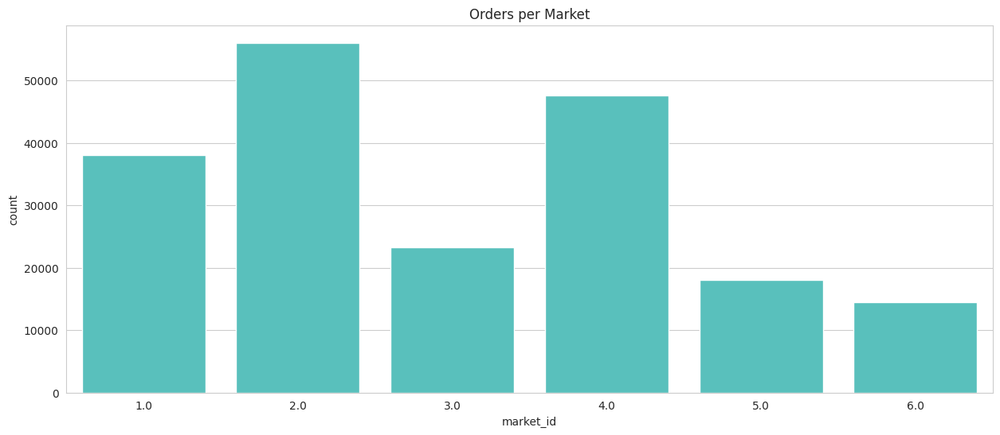

In [ ]:
plt.figure(figsize = (15,6))
sns.set_style("whitegrid")
sns.countplot(data = df, x = 'market_id', color = 'mediumturquoise')
plt.title('Orders per Market')
plt.show()

#### Market Id 2 and 4 have recieved highest number of orders among all ids.

In [ ]:
df_1 = df.groupby(['order_protocol','day_of_week_d']).agg({'subtotal':'mean'}).reset_index()
df_2 = df.groupby(['order_protocol','day_of_week_d']).agg({'time_taken':'mean'}).reset_index()

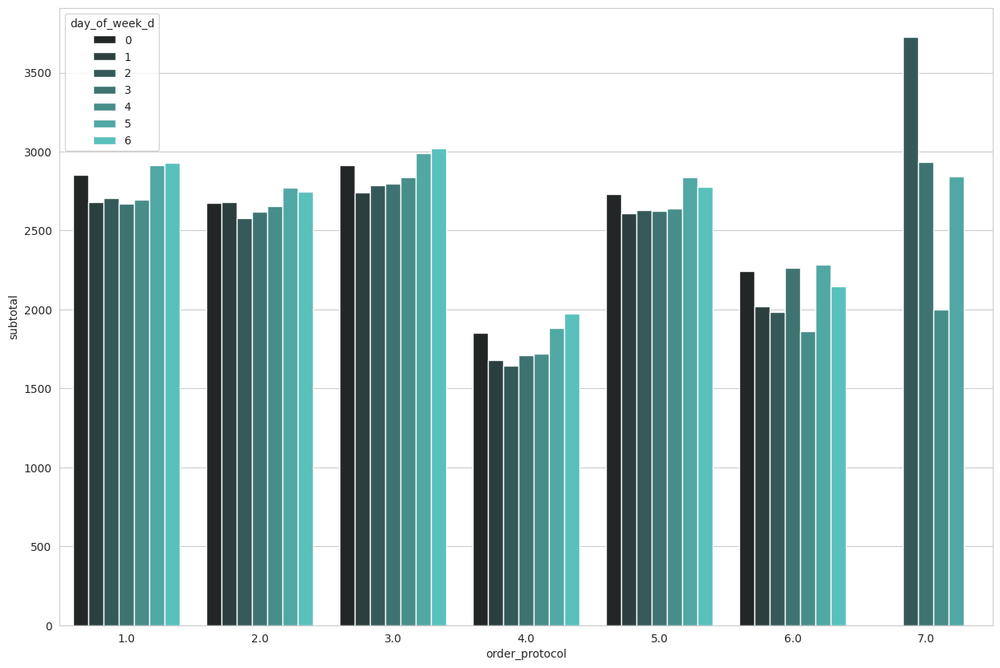

In [ ]:
plt.figure(figsize = (15,10))
sns.set_style("whitegrid")
palette = sns.color_palette("Paired")
sns.barplot(data = df_1, x = 'order_protocol', y = 'subtotal', hue = 'day_of_week_d', color = 'mediumturquoise')
plt.show()

#### This is a simple comparison between different order protocol for different day of the week.

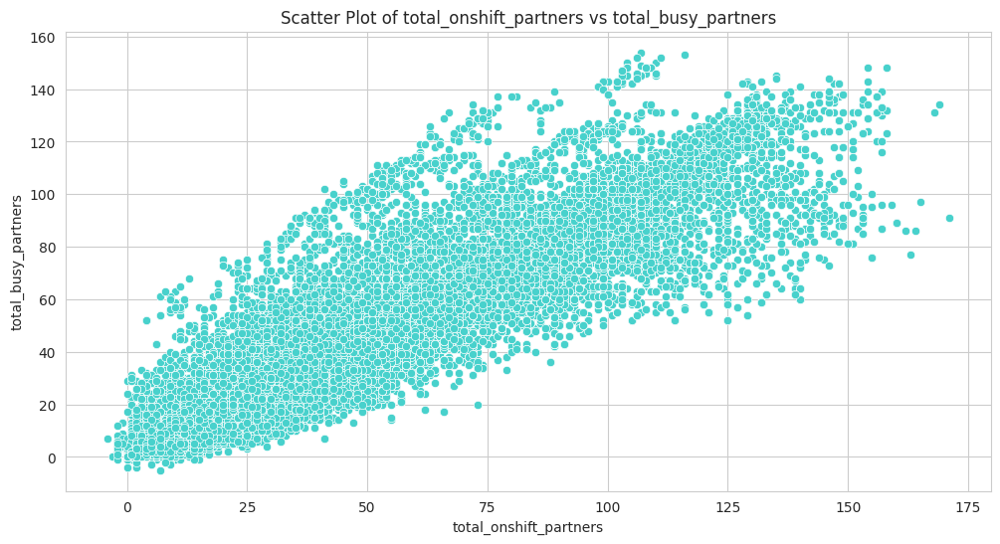

In [ ]:
plt.figure(figsize = (12,6))
sns.set_style("whitegrid")
palette = sns.color_palette("Paired")
sns.scatterplot(data = df, x = 'total_onshift_partners', y = 'total_busy_partners', color = 'mediumturquoise')
plt.title('Scatter Plot of total_onshift_partners vs total_busy_partners')
plt.show()

#### Here we are seeing linear relationship between 'total_onshift_partners' and 'total_busy_partners'

In [ ]:
df_3 = df.groupby('day_of_week_d').agg({'time_taken': 'mean', 'subtotal': 'mean'}).reset_index()
df_3

,day_of_week_d,time_taken,subtotal
0,0,51.468550,2720.609619
1,1,46.467769,2578.353223
2,2,44.147262,2590.673648
3,3,47.339430,2595.263543
4,4,44.751063,2616.851495
5,5,50.113749,2801.565677
6,6,52.816854,2791.151017


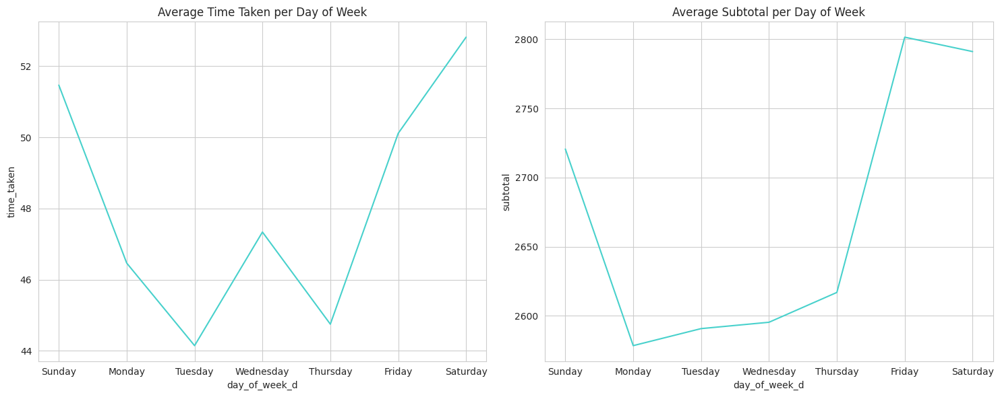

In [ ]:
plt.figure(figsize = (15,6))
sns.set_style("whitegrid")
days = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

plt.subplot(1,2,1)
sns.lineplot(data = df_3, x = 'day_of_week_d', y = 'time_taken', color = 'mediumturquoise')
ax = plt.gca()
ax.set_xticks(range(7))
ax.set_xticklabels(days)
plt.title('Average Time Taken per Day of Week')

plt.subplot(1,2,2)
sns.lineplot(data = df_3, x = 'day_of_week_d', y = 'subtotal', color = 'mediumturquoise')
ax = plt.gca()
ax.set_xticks(range(7))
ax.set_xticklabels(days)
plt.title('Average Subtotal per Day of Week')

plt.tight_layout()
plt.show()

##### Max delivery time peaks on the weekends.
##### Consequently average order values('subtotal') are also higher on the weekends.

In [ ]:
df_4 = df.groupby('hour_d').agg({'time_taken': 'mean', 'subtotal': 'mean'}).reset_index()

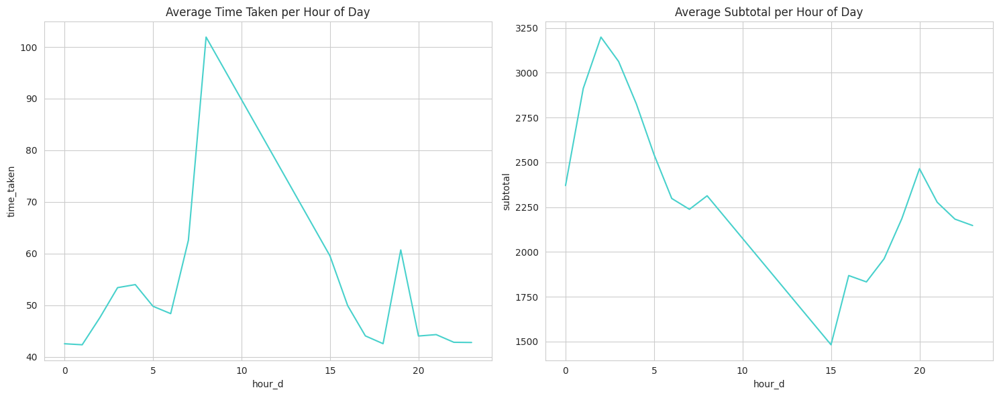

In [ ]:
plt.figure(figsize = (15,6))
sns.set_style("whitegrid")

plt.subplot(1,2,1)
sns.lineplot(data = df_4, x = 'hour_d', y = 'time_taken', color = 'mediumturquoise')
plt.title('Average Time Taken per Hour of Day')

plt.subplot(1,2,2)
sns.lineplot(data = df_4, x = 'hour_d', y = 'subtotal', color = 'mediumturquoise')
plt.title('Average Subtotal per Hour of Day')

plt.tight_layout()
plt.show()

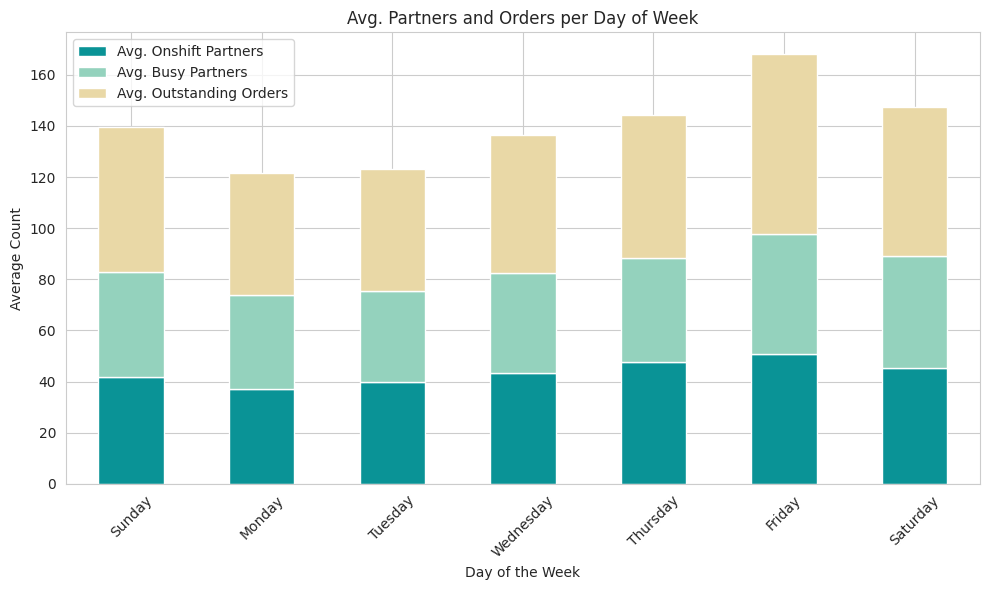

In [ ]:
avg_data = pd.DataFrame({
    'Avg. Onshift Partners': df.groupby('day_of_week_d')['total_onshift_partners'].mean(),
    'Avg. Busy Partners': df.groupby('day_of_week_d')['total_busy_partners'].mean(),
    'Avg. Outstanding Orders': df.groupby('day_of_week_d')['total_outstanding_orders'].mean()
})
avg_data.plot(kind='bar', stacked=True, figsize=(10, 6),color = ['#0a9396', '#94d2bd', '#e9d8a6', '#ee9b00', '#bb3e03'])
plt.title('Avg. Partners and Orders per Day of Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Count')
plt.xticks(ticks=range(7), labels=days, rotation=45)
plt.tight_layout()
plt.show()

##### The graph above gives a clear picture of partner availability and outstanding orders on each day in a week.

##### Clearly Friday's have the most number of available partners.

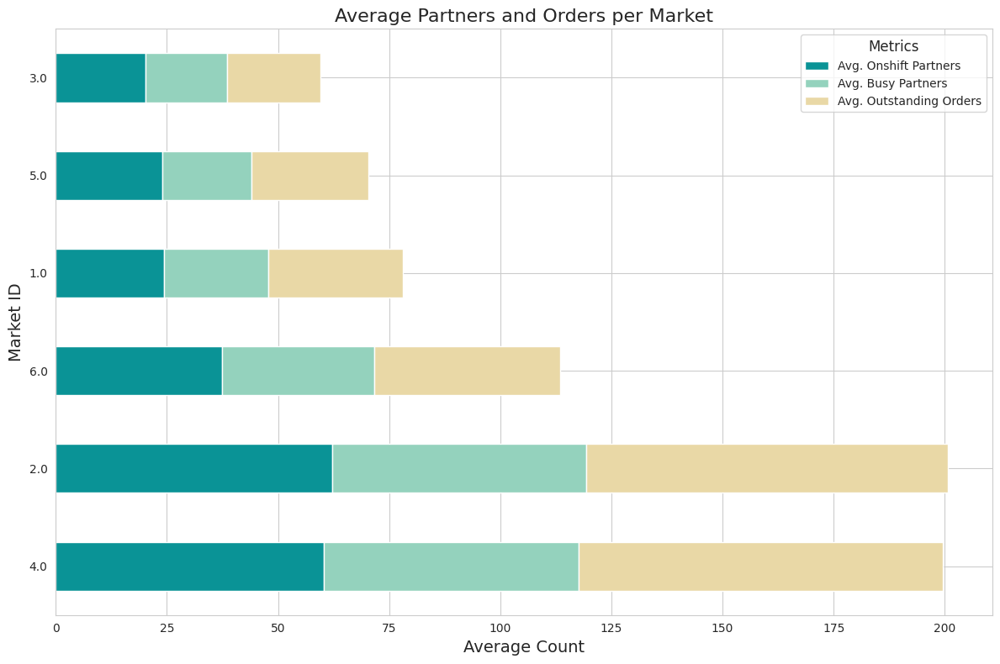

In [ ]:
avg_data_market = pd.DataFrame({
    'Avg. Onshift Partners': df.groupby('market_id')['total_onshift_partners'].mean(),
    'Avg. Busy Partners': df.groupby('market_id')['total_busy_partners'].mean(),
    'Avg. Outstanding Orders': df.groupby('market_id')['total_outstanding_orders'].mean()
}).sort_values('Avg. Outstanding Orders', ascending=False)

avg_data_market.plot(
    kind='barh',
    stacked=True,
    figsize=(12, 8),
    color = ['#0a9396', '#94d2bd', '#e9d8a6', '#ee9b00', '#bb3e03']
)

plt.title('Average Partners and Orders per Market', fontsize=16)
plt.xlabel('Average Count', fontsize=14)
plt.ylabel('Market ID', fontsize=14)
plt.legend(title='Metrics', fontsize=10, title_fontsize=12)
plt.tight_layout()

plt.show()

#### Market ID 2 and 4 have highest number of orders and so do highest number of delivery partners.

In [ ]:
df_corr = df.drop(['market_id','store_primary_category','order_protocol','day_of_week','year_o','month_o','day_o','hour_o','minute_o','second_o','year_d','month_d','day_d','minute_d','second_d'],axis =1)

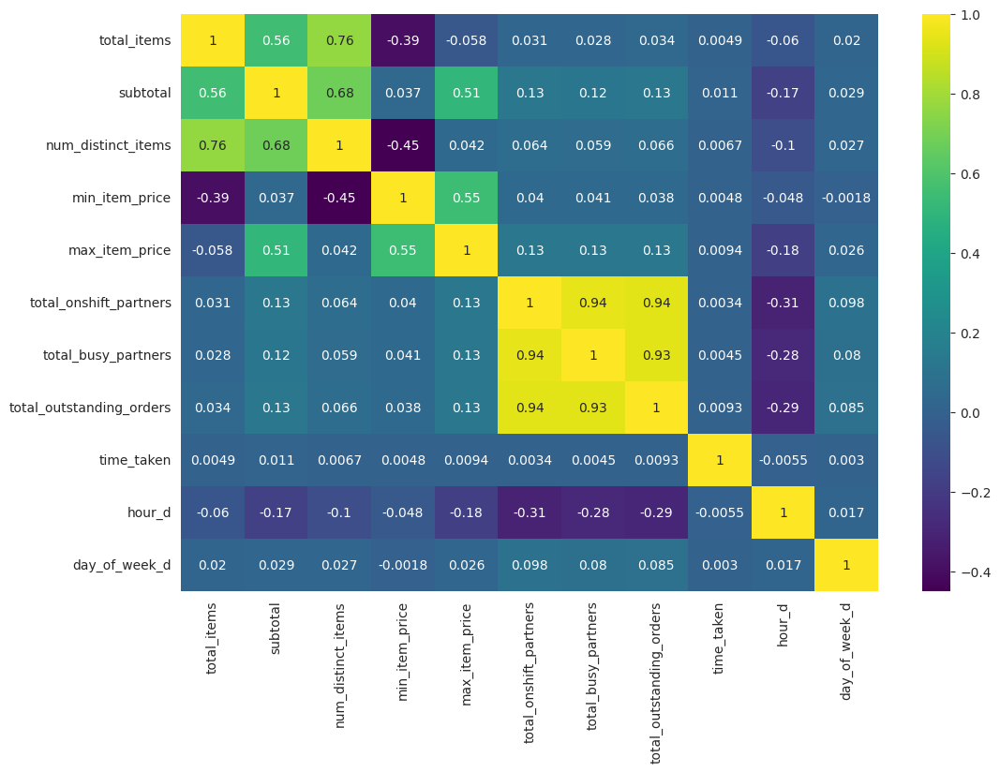

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_corr.corr(), annot=True, cmap='viridis')
plt.show()

##### We can see above that attributes, 'total_onshift_partners', 'total_busy_partners', 'total_outstanding_orders', have a significantly high correlation(0.94).

##### We drop 'total_busy_partners' and 'total_outstanding_orders' to see the effect of the correlation matrix.

In [ ]:
df_corr = df.drop(['market_id','store_primary_category','order_protocol','day_of_week','year_o','month_o','day_o','hour_o','minute_o','second_o','year_d','month_d','day_d','minute_d','second_d','total_busy_partners','total_outstanding_orders'],axis = 1)

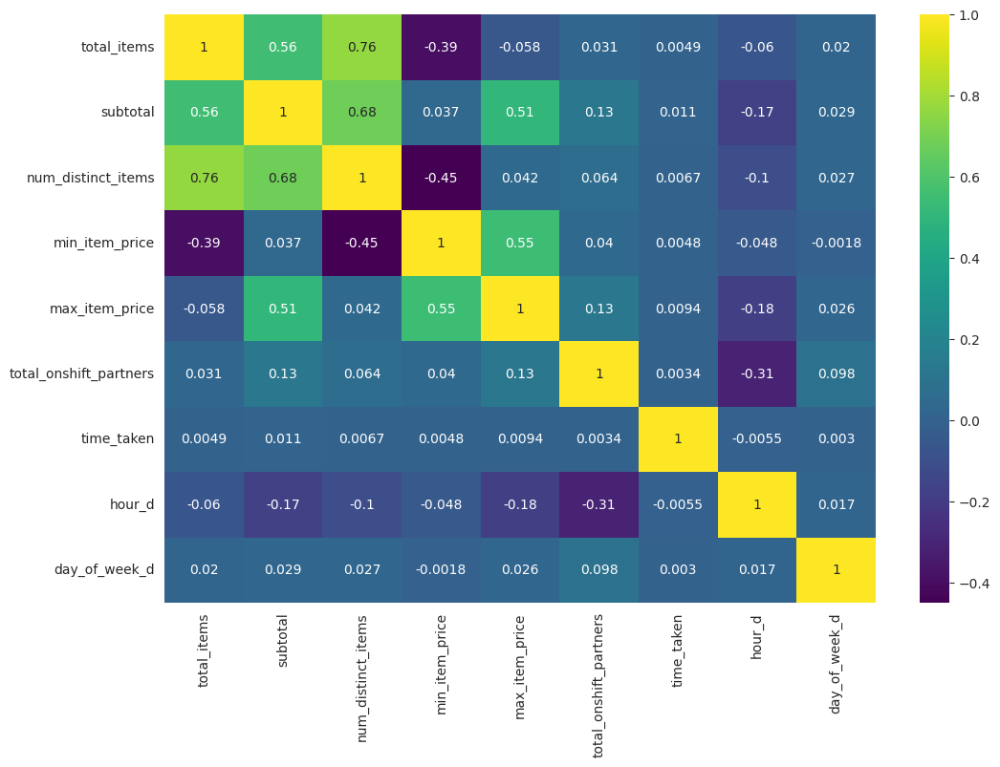

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_corr.corr(), annot=True, cmap='viridis')
plt.show()

##### After dropping the attributes, we do not see any highly correlated features, so we permanently drop those features.

In [ ]:
df.drop(['total_busy_partners','total_outstanding_orders'],axis = 1, inplace = True)

In [ ]:
df.head()

,market_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,time_taken,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,american,1.0,4,3441,4,557,1239,33.0,63.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,mexican,2.0,1,1900,1,1400,1400,1.0,67.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,american,1.0,1,1900,1,1900,1900,1.0,30.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,american,1.0,6,6900,5,600,1800,1.0,51.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,american,1.0,3,3900,3,1100,1600,6.0,40.0,...,2,40,36,2015,2,15,3,20,26,6


### Distribution PLot and Box Plot

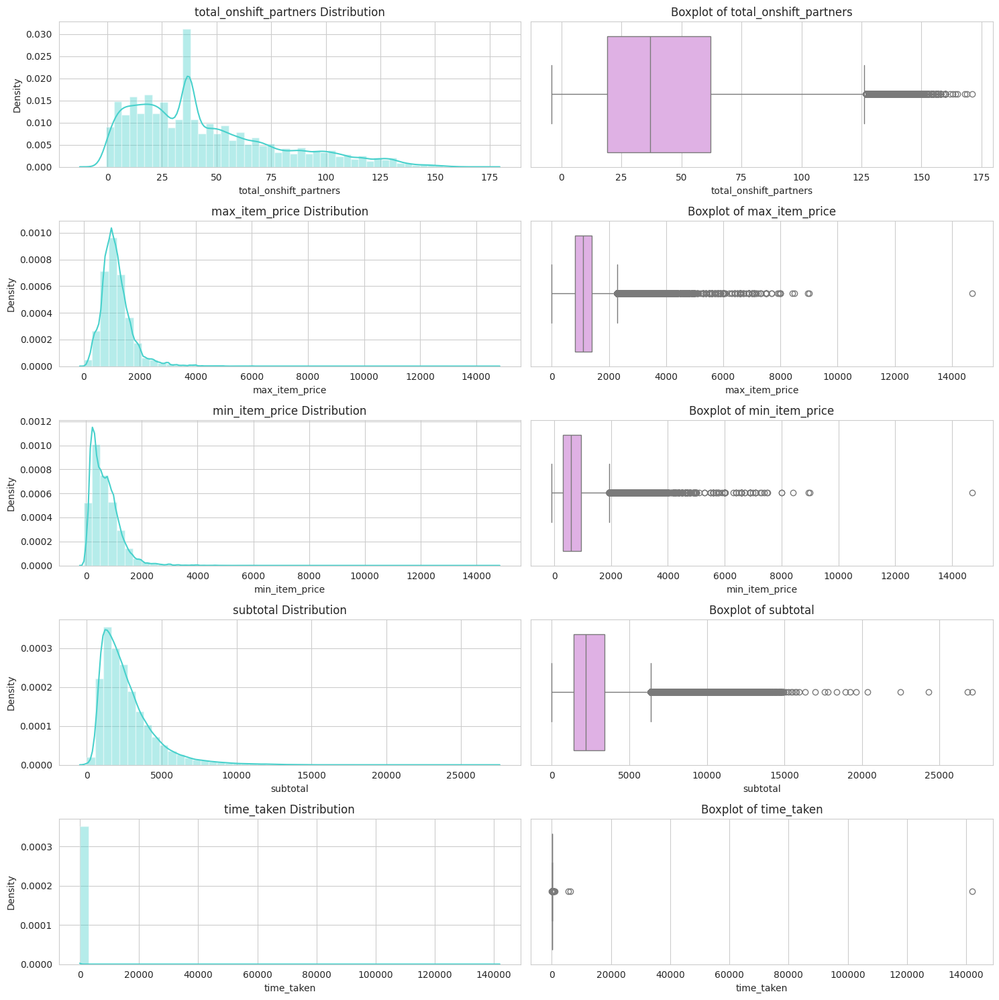

In [ ]:
num_cols = ['total_onshift_partners', 'max_item_price','min_item_price', 'subtotal', 'time_taken']

fig6, ax = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

for i, col in enumerate(num_cols):
    sns.distplot(df[col], ax=ax[i, 0], color='mediumturquoise')
    sns.boxplot(data=df, x=df[col], ax=ax[i, 1], color='#E6A9EC')
    ax[i, 0].set_title(f"{col} Distribution")
    ax[i, 1].set_title(f"Boxplot of {col}")


plt.tight_layout()

##### We consider values lying above 99th percentile or +3 standard deviations away as outliers.
##### We notice quite a few outliers in the data for the above attributes, dropping them would be ideal for model performance.

### Outlier Treatment

In [ ]:
p1 = np.percentile(df['total_onshift_partners'], 99)
df[df['total_onshift_partners'] > p1].count()[:1]

,0
market_id,1859


In [ ]:
p2 = np.percentile(df['max_item_price'], 99)
df[df['max_item_price'] > p2].count()[:1]

,0
market_id,1973


In [ ]:
p3 = np.percentile(df['subtotal'], 99)
df[df['subtotal'] > p3].count()[:1]

,0
market_id,1975


In [ ]:
p4 = np.percentile(df['time_taken'], 99)
df[df['time_taken'] > p4].count()[:1]

,0
market_id,1915


In [ ]:
p5 = np.percentile(df['min_item_price'], 99)
df[df['min_item_price'] > p5].count()[:1]

,0
market_id,1887


In [ ]:
# Worst Case Scenario
# Even if we assume all outliers to be unique (which is exteme) data loss would be around 4.8%

((1606+1712+1763+1711+1698)/len(df))*100

4.300454358958773

In [ ]:
# Dropping all the outliers

df = df[~(df['total_onshift_partners'] > p1)]
df = df[~(df['max_item_price'] > p2)]
df = df[~(df['subtotal'] > p3)]
df = df[~(df['time_taken'] > p4)]
df = df[~(df['min_item_price'] > p5)]

In [ ]:
df.shape

(189048, 24)

In [ ]:
df.head()

,market_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,time_taken,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,american,1.0,4,3441,4,557,1239,33.0,63.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,mexican,2.0,1,1900,1,1400,1400,1.0,67.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,american,1.0,1,1900,1,1900,1900,1.0,30.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,american,1.0,6,6900,5,600,1800,1.0,51.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,american,1.0,3,3900,3,1100,1600,6.0,40.0,...,2,40,36,2015,2,15,3,20,26,6


In [ ]:
df['time_taken'].max(),df['time_taken'].min()

(108.0, 2.0)

In [ ]:
df.isna().sum()

,0
market_id,0
store_primary_category,0
order_protocol,0
total_items,0
subtotal,0
num_distinct_items,0
min_item_price,0
max_item_price,0
total_onshift_partners,0
time_taken,0


## Target Encoding

In [ ]:
df['store_primary_category'] = df.groupby('store_primary_category')['time_taken'].transform('mean')

In [ ]:
df.head()

,market_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,time_taken,...,hour_o,minute_o,second_o,year_d,month_d,day_d,hour_d,minute_d,second_d,day_of_week_d
0,1.0,46.782508,1.0,4,3441,4,557,1239,33.0,63.0,...,22,24,17,2015,2,6,23,27,16,4
1,2.0,43.834211,2.0,1,1900,1,1400,1400,1.0,67.0,...,21,49,25,2015,2,10,22,56,29,1
2,3.0,46.782508,1.0,1,1900,1,1900,1900,1.0,30.0,...,20,39,28,2015,1,22,21,9,9,3
3,3.0,46.782508,1.0,6,6900,5,600,1800,1.0,51.0,...,21,21,45,2015,2,3,22,13,0,1
4,3.0,46.782508,1.0,3,3900,3,1100,1600,6.0,40.0,...,2,40,36,2015,2,15,3,20,26,6


## Scaling

In [ ]:
X = df.drop('time_taken', axis=1)
y = df['time_taken']

In [ ]:
X.shape

(189048, 23)

In [ ]:
y.shape

(189048,)

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,y,test_size = 0.2,random_state = 42)

In [ ]:
x_train,x_val,y_train,y_val = train_test_split(X_train,Y_train,test_size = 0.25,random_state = 42)

In [ ]:
scaler = StandardScaler()

x_train = scaler.fit_transform(x_train)
x_val = scaler.transform(x_val)
X_test = scaler.transform(X_test)

In [ ]:
x_train

array([[-0.64536072,  2.1358035 ,  0.08140388, ..., -1.00587487,
         1.30625832, -0.09508563],
       [-1.30003703,  0.10511819,  1.40786259, ..., -1.58135166,
         0.3809843 ,  1.37031825],
       [ 0.00931558,  1.56361195,  0.74463324, ..., -0.89077951,
        -1.18041561, -1.07202155],
       ...,
       [ 0.66399188,  0.17621663,  0.08140388, ..., -0.94832719,
        -1.06475636,  0.88185029],
       [-0.64536072,  0.12547938,  1.40786259, ..., -0.31530271,
        -0.94909711, -1.07202155],
       [-0.64536072,  0.65860776, -1.24505484, ..., -0.94832719,
         0.49664355,  0.39338233]])

## Model Building

In [ ]:
model = Sequential([
    Dense(512, input_shape=(X_train.shape[1],)),
    LeakyReLU(),

    Dense(256),
    BatchNormalization(),
    LeakyReLU(),

    Dense(128),
    LeakyReLU(),

    Dense(64),
    BatchNormalization(),
    LeakyReLU(),

    Dense(32),
    LeakyReLU(),

    Dense(8),
    BatchNormalization(),
    LeakyReLU(),

    Dense(1, activation="linear")  # Output layer for regression
])

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_37 (Dense)                     │ (None, 512)                 │          12,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_32 (LeakyReLU)           │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_33 (LeakyReLU)           │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_34 (LeakyReLU)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_35 (LeakyReLU)           │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_36 (LeakyReLU)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_42 (Dense)                     │ (None, 8)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 8)                   │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_37 (LeakyReLU)           │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 188,433 (736.07 KB)

 Trainable params: 187,777 (733.50 KB)

 Non-trainable params: 656 (2.56 KB)

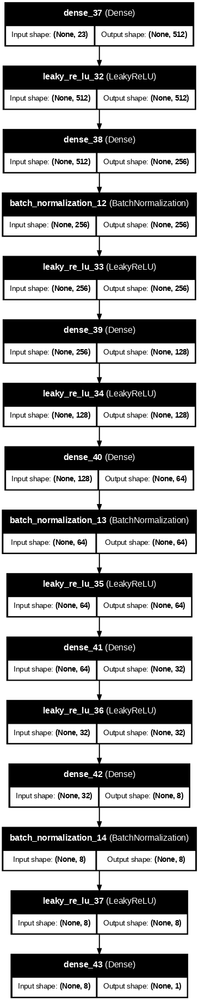

In [ ]:
plot_model(model,
           to_file="model.png",
           show_shapes=True,
           show_layer_names=True,
           dpi=70)

In [ ]:
model.compile(optimizer='adam', loss=Huber(delta=1.0), metrics=["mae"])

In [ ]:
def advanced_lr_decay(epoch, lr):
    if epoch < 50:
        return lr * 0.97
    elif epoch < 100:
        return lr * 0.95
    elif epoch < 150:
        return lr * 0.93
    else:
        return lr * 0.90

In [ ]:
scheduler = tf.keras.callbacks.LearningRateScheduler(advanced_lr_decay)

early_stop = EarlyStopping(monitor="val_mae", patience=30, restore_best_weights=True)

ModelCheckpointCallback = tf.keras.callbacks.ModelCheckpoint(filepath='best_model_reg1.h5',
                                                             monitor='val_accuracy',
                                                             save_best_only=True,
                                                             mode='max')
# TensorBoard Logging
log_dir = "logs/tuning/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
history = model.fit(
    x_train, y_train,
    epochs=200, batch_size=256,
    validation_data=(x_val, y_val),
    callbacks=[early_stop, scheduler, ModelCheckpointCallback, tensorboard_callback]
)

Epoch 1/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 45.3411 - mae: 45.8411 - val_loss: 42.9548 - val_mae: 43.4548 - learning_rate: 9.7000e-04
Epoch 2/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 41.8223 - mae: 42.3223 - val_loss: 35.7828 - val_mae: 36.2827 - learning_rate: 9.4090e-04
Epoch 3/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - loss: 34.2078 - mae: 34.7075 - val_loss: 26.2022 - val_mae: 26.7004 - learning_rate: 9.1267e-04
Epoch 4/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 24.0604 - mae: 24.5575 - val_loss: 16.1824 - val_mae: 16.6750 - learning_rate: 8.8529e-04
Epoch 5/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - loss: 13.6215 - mae: 14.1105 - val_loss: 6.1641 - val_mae: 6.6509 - learning_rate: 8.5873e-04
Epoch 6/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 4.9827 - mae: 5.4268 - val_loss: 4.3401 - val_mae: 4.7881 - learning_rate: 8.3297e-04
Epoch 7/200
444/444 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 4.1437 - mae: 4.5717 - val_lo

In [ ]:
epochs = history.epoch
loss = history.history["loss"]
val_loss = history.history["val_loss"]

mae = history.history["mae"]
val_mae = history.history["val_mae"]

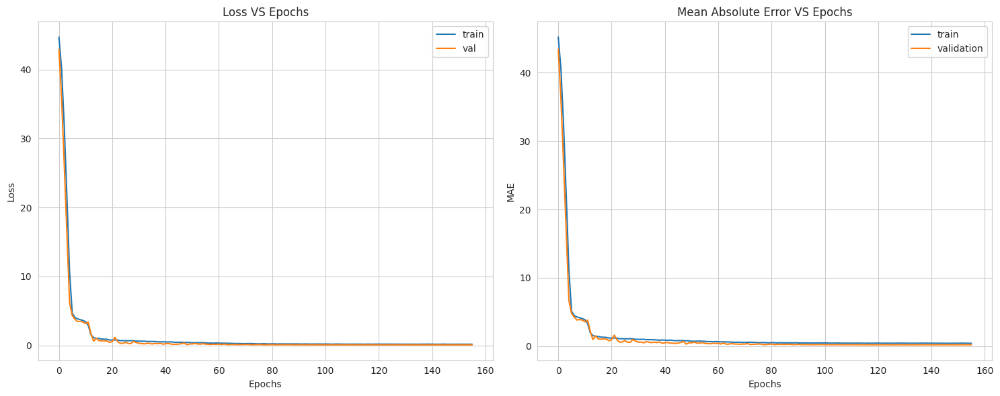

In [ ]:
plt.figure(figsize = (15,6))
sns.set_style("whitegrid")

plt.subplot(1,2,1)
plt.plot(epochs, loss, label="train")
plt.plot(epochs, val_loss, label="val")
plt.legend()
plt.title("Loss VS Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.subplot(1,2,2)
plt.plot(epochs, mae, label="train")
plt.plot(epochs, val_mae, label="validation")
plt.legend()
plt.title("Mean Absolute Error VS Epochs")
plt.xlabel("Epochs")
plt.ylabel("MAE")

plt.tight_layout()
plt.show()

In [ ]:
%reload_ext tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/tuning/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 30968), started 1:50:56 ago. (Use '!kill 30968' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
model.save("best_model_reg1.h5")

In [ ]:
# Load the best model saved during tuning
final_model = load_model('best_model_reg1.h5')

# Evaluate on validation/test data
val_loss, val_mae = final_model.evaluate(x_val, y_val)
print(f'Best Model Validation MAE: {val_mae:.4f}')

1182/1182 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0955 - mean_absolute_error: 0.2057
Best Model Validation MAE: 0.1995


In [ ]:
test_loss, test_mae = final_model.evaluate(X_test, Y_test)
print(f'Best Model Test MAE: {test_mae:.4f}')

1182/1182 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.1033 - mean_absolute_error: 0.2141
Best Model Test MAE: 0.2097


In [ ]:
y_pred = final_model.predict(X_test)

1182/1182 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


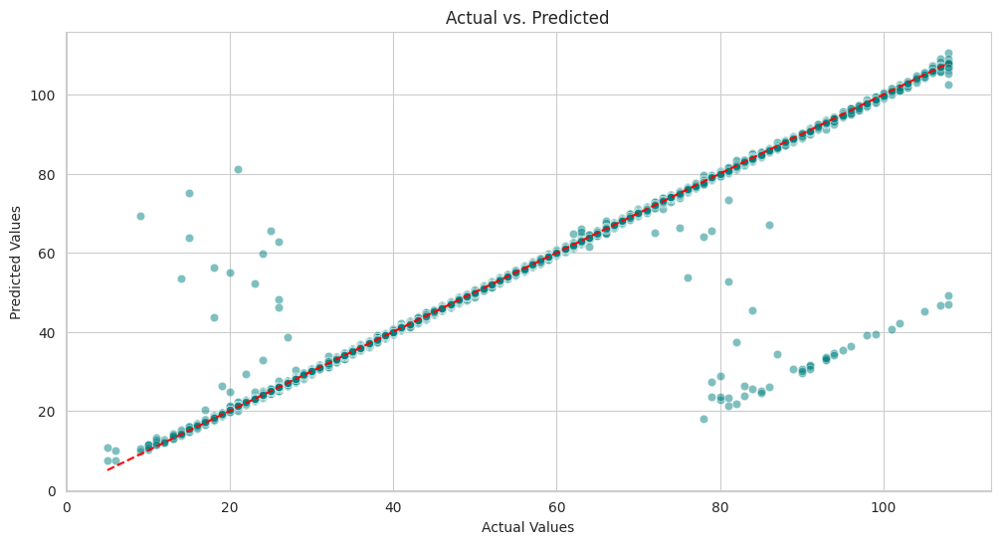

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=Y_test, y=y_pred.flatten(), alpha=0.5, color='teal')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted")
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], linestyle='dashed', color='red')  # Perfect prediction line
plt.show()

In [ ]:
mae = mean_absolute_error(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

print(f"MAE: {mae:.4f}")
print(f"R² Score: {r2:.4f}")

MAE: 0.2097
R² Score: 0.9836


The NN model demonstrates strong predictive performance, with a low Mean Absolute Error (MAE) of 0.2097 on the test set. The high R² score of 0.9836 indicates that the model explains 98.36% of the variance in the target variable. The model also generalizes well, as the validation and test MAE are closely aligned. Given its complexity, the model benefits from advanced techniques like learning rate scheduling, early stopping, and batch normalization, contributing to its robust performance.

## XGBoost

In [ ]:
model_XGBR = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=10,
    random_state=42
)

In [ ]:
model_XGBR.fit(x_train, y_train)
model_XGBR_predictions = model_XGBR.predict(X_test)
mae_XGBR = mean_absolute_error(Y_test, model_XGBR_predictions)
r2_XGBR = r2_score(Y_test, model_XGBR_predictions)

print(f"Mean Absolute Error: {mae_XGBR}")
print(f"R² Score: {r2_XGBR}")

Mean Absolute Error: 0.9981172316732057
R² Score: 0.9746724053532866


XGBoost also performs well, with an R² score of 0.9746, showing its effectiveness in capturing the data patterns. However, its MAE of 0.9981 is significantly higher than the NN model's, suggesting that while the overall fit is strong, the individual predictions are less accurate. XGBoost's lower MAE compared to Linear Regression indicates that it captures non-linear relationships better, but it still lags behind the NN model.

## Linear Regression

In [ ]:
lr_model = LinearRegression()
lr_model.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_lr_pred = lr_model.predict(X_test)

# Calculate Metrics
mae_lr = mean_absolute_error(Y_test, y_lr_pred)
r2_lr = r2_score(Y_test, y_lr_pred)

print(f"Linear Regression Performance:")
print(f"MAE: {mae_lr:.4f}")
print(f"R² Score: {r2_lr:.4f}")

Linear Regression Performance:
MAE: 0.2503
R² Score: 0.9997


Mean Absolute Error (MAE) = 0.2503: This suggests that, on average, the model’s predictions are off by just 0.2503 units.
R² Score = 0.9997: This indicates that 99.97% of the variance in the target variable is explained by the model—a near-perfect fit!

In [2]:
data = {
    "Model": ["Linear Regression", "Neural Network", "XGBoost"],
    "MAE (↓ better)": [0.2503, 0.2097, 0.9981],
    "R² Score (↑ better)": [0.9997, 0.9836, 0.9746],
    "Complexity": ["Low", "High", "Medium"],
    "Interpretability": ["High", "Low", "Moderate"],
}

df = pd.DataFrame(data)

from IPython.display import display
display(df)

,Model,MAE (↓ better),R² Score (↑ better),Complexity,Interpretability
0,Linear Regression,0.2503,0.9997,Low,High
1,Neural Network,0.2097,0.9836,High,Low
2,XGBoost,0.9981,0.9746,Medium,Moderate


**Model Comparison Summary:**

Neural Network (NN) performs best overall, with the lowest MAE (0.2097) and strong R² (0.9836). Advanced techniques like learning rate scheduling and batch normalization enhance its generalization.

Linear Regression shows an extremely high R² (0.9997) but may be overfitting. While simple and interpretable, it might not capture complex patterns.

XGBoost effectively captures non-linear relationships (R² = 0.9746), but its higher MAE (0.9981) suggests less accurate individual predictions compared to NN.